In [2]:
# your code
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
#data for population from 2019 to 2020
df = pd.read_csv("HousingPrices-Amsterdam-August-2021.csv",sep = ',',header=0)

In [4]:
df=df.drop(columns=['Unnamed: 0'])

In [5]:
#no missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 924 entries, 0 to 923
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Address  924 non-null    object 
 1   Zip      924 non-null    object 
 2   Price    920 non-null    float64
 3   Area     924 non-null    int64  
 4   Room     924 non-null    int64  
 5   Lon      924 non-null    float64
 6   Lat      924 non-null    float64
dtypes: float64(3), int64(2), object(2)
memory usage: 50.7+ KB


In [6]:
#describe basic info
df.describe()

,Price,Area,Room,Lon,Lat
count,9.200000e+02,924.000000,924.000000,924.000000,924.000000
mean,6.220654e+05,95.952381,3.571429,4.888605,52.363326
std,5.389942e+05,57.447436,1.592332,0.053140,0.024028
min,1.750000e+05,21.000000,1.000000,4.644819,52.291519
25%,3.500000e+05,60.750000,3.000000,4.855834,52.352077
50%,4.670000e+05,83.000000,3.000000,4.886818,52.364631
75%,7.000000e+05,113.000000,4.000000,4.922337,52.377598
max,5.950000e+06,623.000000,14.000000,5.029122,52.423805


## Understanding the variable

### Zipcode

In [7]:
#Checking how many unique zip codes 
df["Zip"].nunique()

834

In [8]:
# Getting evidence about the neighborhood, region, and street from zipcode
# make string version of original column, call it 'Zip1'
df['Zip1'] = df['Zip'].astype(str)

# make the new columns using string indexing
df['Region'] = df['Zip1'].str[0:2]
df['Neighbor'] = df['Zip1'].str[2:4]
df['Street'] = df['Zip1'].str[5:7]

# get rid of the extra variable (if you want)
df.drop('Zip1', axis=1, inplace=True)

In [9]:
df

,Address,Zip,Price,Area,Room,Lon,Lat,Region,Neighbor,Street
0,"Blasiusstraat 8 2, Amsterdam",1091 CR,685000.0,64,3,4.907736,52.356157,10,91,CR
1,"Kromme Leimuidenstraat 13 H, Amsterdam",1059 EL,475000.0,60,3,4.850476,52.348586,10,59,EL
2,"Zaaiersweg 11 A, Amsterdam",1097 SM,850000.0,109,4,4.944774,52.343782,10,97,SM
3,"Tenerifestraat 40, Amsterdam",1060 TH,580000.0,128,6,4.789928,52.343712,10,60,TH
4,"Winterjanpad 21, Amsterdam",1036 KN,720000.0,138,5,4.902503,52.410538,10,36,KN
...,...,...,...,...,...,...,...,...,...,...
919,"Ringdijk, Amsterdam",1097 AE,750000.0,117,1,4.927757,52.354173,10,97,AE
920,"Kleine Beerstraat 31, Amsterdam",1033 CP,350000.0,72,3,4.890612,52.414587,10,33,CP
921,"Stuyvesantstraat 33 II, Amsterdam",1058 AK,350000.0,51,3,4.856935,52.363256,10,58,AK
922,"John Blankensteinstraat 51, Amsterdam",1095 MB,599000.0,113,4,4.965731,52.375268,10,95,MB


#### Unique Neighborhoods

In [10]:
df["Neighbor"].unique()

array(['91', '59', '97', '60', '36', '51', '33', '53', '58', '73', '19',
       '17', '64', '02', '13', '16', '72', '62', '95', '34', '35', '83',
       '56', '65', '78', '76', '54', '18', '06', '93', '04', '24', '68',
       '75', '11', '55', '94', '07', '67', '25', '52', '57', '15', '61',
       '12', '77', '98', '63', '92', '03', '21', '69', '96', '66', '82',
       '87', '81', '27', '71', '08', '32', '28', '86', '14', '31', '23',
       '74', '22', '79', '09'], dtype=object)

#### Top most frequent neighborhoods

In [11]:
df.Neighbor.value_counts().head(10).sort_values(ascending=False)

17    32
55    29
68    26
53    26
18    25
58    25
02    25
13    24
19    24
57    23
Name: Neighbor, dtype: int64

#### Neighborhoods of the highest housing price (top 10)

In [12]:
# Sorting by column 'Price'
price=df.sort_values(by=['Price'], ascending=False)

In [13]:
price=price.head(10)
price

,Address,Zip,Price,Area,Room,Lon,Lat,Region,Neighbor,Street
195,"Keizersgracht 544, Amsterdam",1017 EL,5950000.0,394,10,4.887378,52.365078,10,17,EL
837,"Oranje Nassaulaan 9, Amsterdam",1075 AH,5850000.0,480,14,4.863729,52.354874,10,75,AH
305,"Singel 318, Amsterdam",1016 AE,4900000.0,623,13,4.887869,52.371039,10,16,AE
103,"Westeinde 16, Amsterdam",1017 ZP,4550000.0,497,13,4.898620,52.358798,10,17,ZP
179,"Dam 5 V, Amsterdam",1012 JS,4495000.0,178,5,4.894290,52.373106,10,12,JS
33,"Vondelstraat 51 hs, Amsterdam",1054 GJ,3925000.0,319,7,4.875471,52.361571,10,54,GJ
301,"Badhuiskade 353, Amsterdam",1031 KV,3680000.0,374,4,4.905695,52.385321,10,31,KV
276,"Sophialaan 45, Amsterdam",1075 BM,3500000.0,374,7,4.857608,52.352366,10,75,BM
334,"Singel 146 A, Amsterdam",1015 AG,3500000.0,348,8,4.889816,52.375532,10,15,AG
264,"Olympiakade 12, Amsterdam",1076 XP,2750000.0,309,8,4.862413,52.349528,10,76,XP


- The most expensive house, 5,950,000 euros is located in the postal code area 1017, which is near to the centre and DePijp
- The second most expensive house, 5,850,000 is located in the postal code area 1075, right down the Vondelpark.

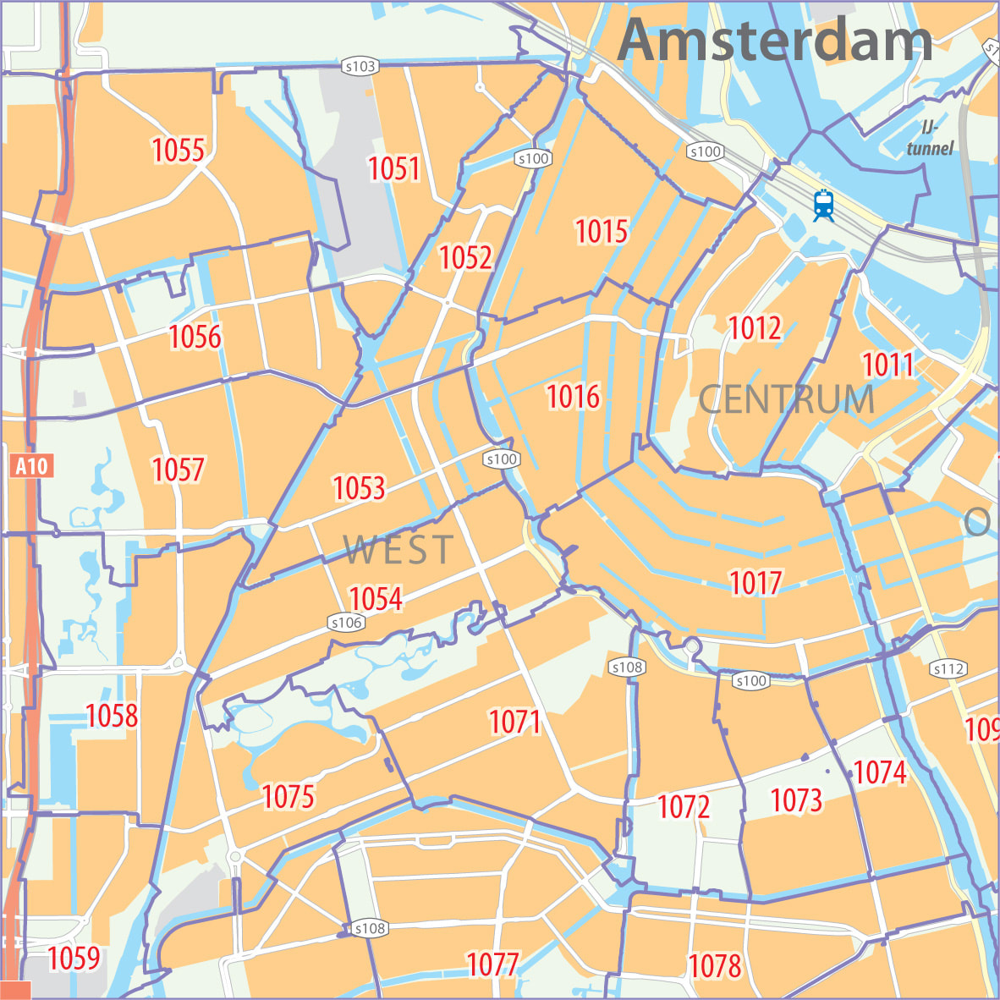

In [14]:
from IPython import display
display.Image("http://www.kaartenplattegrond.nl/uploads/1/3/3/4/13340474/s792817144540433370_p121_i4_w1182.jpeg",width=300, height=300)

# Most expensive neighborhoods

#### The location where the top 10 highest housing price Neighborhoods

In [15]:
Neighbordict=dict(price['Neighbor'].value_counts())
Neighbordict

{'17': 2, '75': 2, '16': 1, '12': 1, '54': 1, '31': 1, '15': 1, '76': 1}

In [16]:
#The top 10 highest housing price Neighborhoods (in a dataframe)
pd.DataFrame(price['Neighbor'].value_counts().nlargest(10))

,Neighbor
17,2
75,2
16,1
12,1
54,1
31,1
15,1
76,1


- The top 10 expensive houses were located under 8 different neighborhoods

In [17]:
#Extracting only the values from the dictionary
Neighborcode=[Neighbordict[nb] for nb in Neighbordict]
Neighborcode

[2, 2, 1, 1, 1, 1, 1, 1]

In [18]:
### What would be the average price of the most expensive neighborhoods? Based on our data?

In [19]:
#sorting houses in the top 10 housing prices neighborhoods
#creating dataframe only with those neighborcodes above (neighborhood of the top 10 housing price )
Nb_sorted=df[df["Neighbor"].isin(Neighbordict)]
Nb_sorted

,Address,Zip,Price,Area,Room,Lon,Lat,Region,Neighbor,Street
13,"Amstel 124 B, Amsterdam",1017 AD,575000.0,70,2,4.897782,52.366928,10,17,AD
20,"Keizersgracht 171 F, Amsterdam",1016 DP,1625000.0,199,6,4.885830,52.374742,10,16,DP
32,"Van Tuyll van Serooskerkenweg 86 H, Amsterdam",1076 JP,735000.0,83,3,4.861090,52.344643,10,76,JP
33,"Vondelstraat 51 hs, Amsterdam",1054 GJ,3925000.0,319,7,4.875471,52.361571,10,54,GJ
37,"J.J. Cremerplein 24 II, Amsterdam",1054 TL,570000.0,63,3,4.858560,52.359929,10,54,TL
...,...,...,...,...,...,...,...,...,...,...
902,"Lauriergracht 89, Amsterdam",1016 RJ,1300000.0,139,5,4.879252,52.370823,10,16,RJ
906,"Buiksloterweg 99, Amsterdam",1031 CJ,1250000.0,180,9,4.914882,52.388128,10,31,CJ
910,"Valeriusstraat 193, Amsterdam",1075 EW,1698000.0,205,5,4.860637,52.351894,10,75,EW
914,"Hagedoornplein 24, Amsterdam",1031 BV,849000.0,111,5,4.913690,52.388160,10,31,BV


In [20]:
#Checking again the unique neighbourhoods (should be 10) 
Nb_sorted['Neighbor'].nunique()

8

### Q. Is the most expensive house located in the highest average housing neighborhoods?

#### Top 10 highest average housing prices, areas & the number of rooms in Amsterdam

In [21]:
#sorting out the most expensive housing neighborhood grouping by average prices
top10_avg_price= df.groupby('Neighbor').mean().sort_values(by=['Price'],ascending = False).reset_index().head(10)
top10_avg_price

,Neighbor,Price,Area,Room,Lon,Lat
0,75,1.509654e+06,148.769231,5.000000,4.859277,52.352815
1,31,1.395600e+06,171.200000,5.000000,4.908616,52.387439
2,17,1.259000e+06,131.187500,4.000000,4.893137,52.363220
3,71,1.256500e+06,123.000000,3.600000,4.880682,52.356953
4,16,1.168632e+06,140.894737,4.578947,4.869861,52.371341
5,28,1.097500e+06,158.500000,4.500000,5.011931,52.402957
6,12,1.093533e+06,113.666667,3.533333,4.894240,52.372861
7,27,1.067000e+06,217.666667,5.333333,4.965498,52.410423
8,77,9.820000e+05,136.894737,4.473684,4.873186,52.346582
9,14,9.630000e+05,108.800000,3.000000,4.881205,52.393870


The most expensive neighborhoods were located in (in order) 1075, 1031,1017,1071, 1016, 1028, 1012, 1027, 1077, and 1014.

#### The top 10 expensive houses in Amsterdam

In [22]:
#sorting out the most expensive housing neighborhood grouping by average prices
top10_price= df.groupby('Neighbor').max().sort_values(by=['Price'],ascending = False).reset_index().head(10)
top10_price

,Neighbor,Address,Zip,Price,Area,Room,Lon,Lat,Region,Street
0,17,"Weteringschans 122 A, Amsterdam",1017 ZP,5950000.0,497,13,4.901713,52.368029,10,ZP
1,75,"Valeriusstraat 193, Amsterdam",1075 XR,5850000.0,480,14,4.865847,52.354874,10,XR
2,16,"Singel 318, Amsterdam",1016 XA,4900000.0,623,13,4.888199,52.378060,10,XA
3,12,"Wijdesteeg 62, Amsterdam",1012 XJ,4495000.0,213,7,4.901320,52.376702,10,XJ
4,54,"Zocherstraat 23 X, Amsterdam",1054 ZT,3925000.0,319,7,4.880571,52.365121,10,ZT
5,31,"Spadinalaan 53, Amsterdam",1031 VD,3680000.0,374,9,4.914882,52.388684,10,VD
6,15,"Westerstraat 268, Amsterdam",1015 ZH,3500000.0,348,8,4.893043,52.382746,10,ZH
7,76,"Van Tuyll van Serooskerkenweg 86 H, Amsterdam",1076 XP,2750000.0,309,8,4.864958,52.349528,10,XP
8,73,"Van Ostadestraat 193 H, Amsterdam",1073 VP,2650000.0,387,10,4.902864,52.355854,10,VP
9,71,"Willemsparkweg 125 C, Amsterdam",1071 VE,2500000.0,202,6,4.885645,52.361226,10,VE


- It doesn't necessarily seem the case that expensive houses are located in the highest average housing neighbourhood.

In [23]:
# from IPython import display
# display.Image("https://slotenmaker365-amsterdam.nl/wp-content/uploads/2018/04/map-amsterdam.png",width=500, height=500)

- The most expensive average housing neighborhood is 1075(Willemspark) , followed by 1017 (Grachtengordel), and 1015 (Jordaan)

[Text(0.5, 1.0, 'Most expensive average housing neighborhoods')]

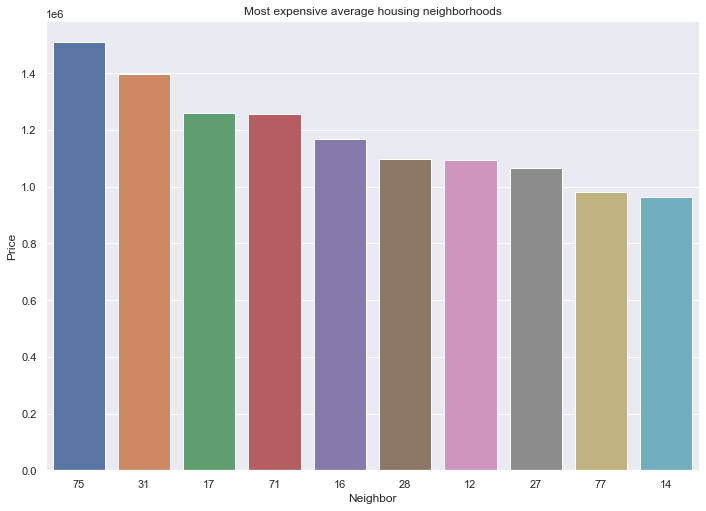

In [24]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(data = top10_avg_price, x='Neighbor', y='Price').set(title='Most expensive average housing neighborhoods')

## Answering to my questions; who are living in those area? And where are those places?

In [25]:
#Found this dataset from the dutch official open data (https://opendata.cbs.nl/statline/portal.html?_la=nl&_catalog=CBS&tableId=83504NED&_theme=270)
#("https://opendata.cbs.nl/statline/#/CBS/nl/dataset/83504NED/table?dl=76864")

In [26]:
info=pd.read_excel('top10_status.xlsx', header=0)

In [27]:
info

,Postal code,Single,Parent in a single-parent household,Partner in couple with child(ren),"Partner in couple, no child(ren)"
0,1012,4105,185,485,2900
1,1014,510,55,770,750
2,1016,4630,290,1050,3430
3,1017,4790,295,1570,4005
4,1027,105,15,135,125
5,1028,75,20,190,125
6,1031,2055,420,1135,1515
7,1071,3495,380,2320,3395
8,1075,3120,415,1835,2735
9,1077,1890,285,2545,2080


### Spliting the zipcode again

In [28]:
# Getting evidence about the neighborhood, region, and street from zipcode
# make string version of original column, call it 'Zip1'
info['Zip1'] = info['Postal code'].astype(str)

# make the new columns using string indexing
info['Street'] = info['Zip1'].str[0:2]
info['Neighbor'] = info['Zip1'].str[2:4]

# get rid of the extra variable (if you want)
info.drop('Zip1', axis=1, inplace=True)

In [29]:
info

,Postal code,Single,Parent in a single-parent household,Partner in couple with child(ren),"Partner in couple, no child(ren)",Street,Neighbor
0,1012,4105,185,485,2900,10,12
1,1014,510,55,770,750,10,14
2,1016,4630,290,1050,3430,10,16
3,1017,4790,295,1570,4005,10,17
4,1027,105,15,135,125,10,27
5,1028,75,20,190,125,10,28
6,1031,2055,420,1135,1515,10,31
7,1071,3495,380,2320,3395,10,71
8,1075,3120,415,1835,2735,10,75
9,1077,1890,285,2545,2080,10,77


# Merge

In [30]:
# combining the original table with the top 10 most expensive neighborhoods info table
df_merged = pd.merge(df, info, right_on='Neighbor', left_on='Neighbor', how='inner').drop(columns=['Lon', 'Lat'])
df_merged

,Address,Zip,Price,Area,Room,Region,Neighbor,Street_x,Postal code,Single,Parent in a single-parent household,Partner in couple with child(ren),"Partner in couple, no child(ren)",Street_y
0,"Amstel 124 B, Amsterdam",1017 AD,575000.0,70,2,10,17,AD,1017,4790,295,1570,4005,10
1,"Vijzelstraat 91, Amsterdam",1017 HH,1185000.0,160,5,10,17,HH,1017,4790,295,1570,4005,10
2,"Falckstraat 47 A, Amsterdam",1017 VV,NaN,147,3,10,17,VV,1017,4790,295,1570,4005,10
3,"Maarten Jansz. Kosterstraat 10, Amsterdam",1017 VX,650000.0,67,4,10,17,VX,1017,4790,295,1570,4005,10
4,"Westeinde 16, Amsterdam",1017 ZP,4550000.0,497,13,10,17,ZP,1017,4790,295,1570,4005,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,"Badhuiskade 353, Amsterdam",1031 KV,3680000.0,374,4,10,31,KV,1031,2055,420,1135,1515,10
122,"Spadinalaan 53, Amsterdam",1031 KB,650000.0,90,3,10,31,KB,1031,2055,420,1135,1515,10
123,"Magnoliastraat 10, Amsterdam",1031 VD,549000.0,101,4,10,31,VD,1031,2055,420,1135,1515,10
124,"Buiksloterweg 99, Amsterdam",1031 CJ,1250000.0,180,9,10,31,CJ,1031,2055,420,1135,1515,10


In [31]:
#Checking whether the 10 unique zip codes are in the data frame
df_merged.Neighbor.nunique()

10

## Residents' information in the top 10 most expensive neighborhoods

In [32]:
#same as above, sorting out price
#sorting out the most expensive housing neighborhood grouping by average prices
top10_neigh_status= df_merged.groupby('Neighbor').mean().sort_values(by=['Price'],ascending = False).reset_index().head(10)
top10_neigh_status

,Neighbor,Price,Area,Room,Postal code,Single,Parent in a single-parent household,Partner in couple with child(ren),"Partner in couple, no child(ren)"
0,75,1.509654e+06,148.769231,5.000000,1075.0,3120.0,415.0,1835.0,2735.0
1,31,1.395600e+06,171.200000,5.000000,1031.0,2055.0,420.0,1135.0,1515.0
2,17,1.259000e+06,131.187500,4.000000,1017.0,4790.0,295.0,1570.0,4005.0
3,71,1.256500e+06,123.000000,3.600000,1071.0,3495.0,380.0,2320.0,3395.0
4,16,1.168632e+06,140.894737,4.578947,1016.0,4630.0,290.0,1050.0,3430.0
5,28,1.097500e+06,158.500000,4.500000,1028.0,75.0,20.0,190.0,125.0
6,12,1.093533e+06,113.666667,3.533333,1012.0,4105.0,185.0,485.0,2900.0
7,27,1.067000e+06,217.666667,5.333333,1027.0,105.0,15.0,135.0,125.0
8,77,9.820000e+05,136.894737,4.473684,1077.0,1890.0,285.0,2545.0,2080.0
9,14,9.630000e+05,108.800000,3.000000,1014.0,510.0,55.0,770.0,750.0


- The most expensive neighbourhood was located in 1075 (Willemspark) postal code area with the average housing price of 1,509,654 euros: The biggest proportion was single, followed by partner with no children, partner with children and single parents. Bettwen partners and single parents, there's a huge gap.
- The second most expensive neighbourhood was in the postal code 1031 with the average housing price of 1,395,600 euros. This area has been developed recently with lots of new apartments.
- The third most expensive neighborhood was located in the postal code 1017 (Grachtengordel), where it's near to the city centre and DePijip (very hip & old district): The biggest proportion is single, followed by partner with no children, partner with children and parents in sigle parents. Between partners and single parents, there's a huge gap.
- The fourth most expensive neighborhood was 1071, where is the neighbourhood district to 1075 (Willemspark). 
- The fifth most expensive neighborhood was 1016, where the neighbourhood distrcits are central, Jordann and Vondelpark.
- Among the 10 expensive neighbourhood, for people with kid(s), the neighborhood 1077 (Amsterdam-Zuid) was most popular.

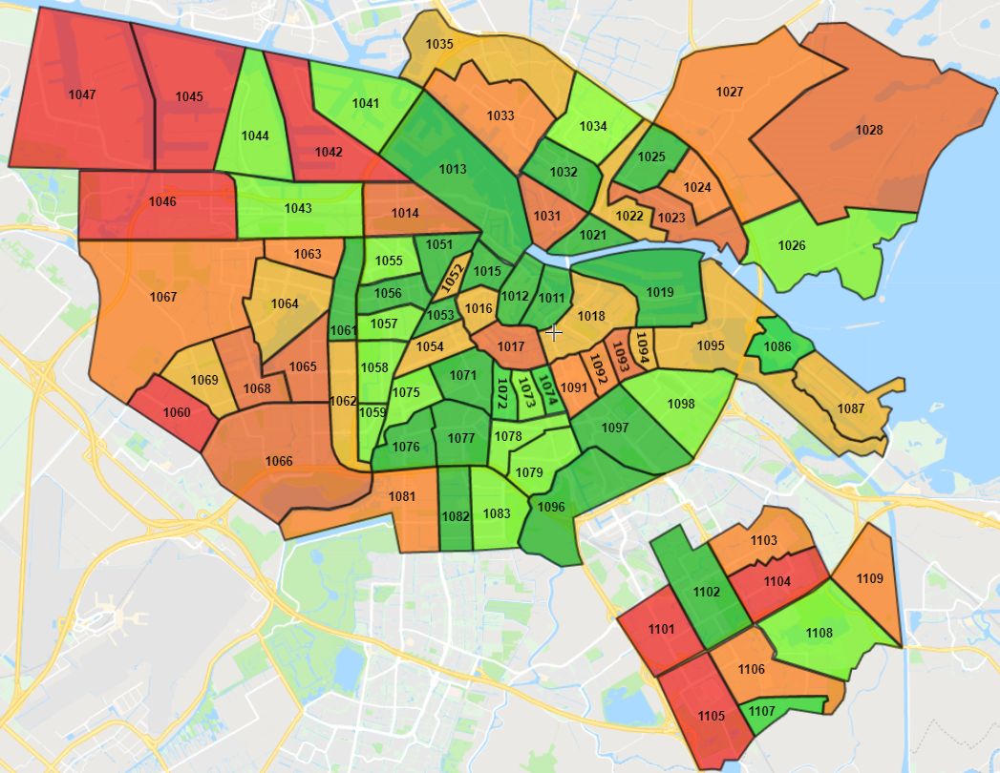

In [33]:
from IPython import display
display.Image("https://slotenmaker365-amsterdam.nl/wp-content/uploads/2018/04/map-amsterdam.png",width=500, height=500)

## Single

In [34]:
#sorting out the most expensive housing neighborhood grouping by average prices
top10_neigh_status_single= top10_neigh_status.groupby('Neighbor').sum().sort_values(by=['Single'],ascending = False).reset_index().head(10)
top10_neigh_status_single

,Neighbor,Price,Area,Room,Postal code,Single,Parent in a single-parent household,Partner in couple with child(ren),"Partner in couple, no child(ren)"
0,17,1.259000e+06,131.187500,4.000000,1017.0,4790.0,295.0,1570.0,4005.0
1,16,1.168632e+06,140.894737,4.578947,1016.0,4630.0,290.0,1050.0,3430.0
2,12,1.093533e+06,113.666667,3.533333,1012.0,4105.0,185.0,485.0,2900.0
3,71,1.256500e+06,123.000000,3.600000,1071.0,3495.0,380.0,2320.0,3395.0
4,75,1.509654e+06,148.769231,5.000000,1075.0,3120.0,415.0,1835.0,2735.0
5,31,1.395600e+06,171.200000,5.000000,1031.0,2055.0,420.0,1135.0,1515.0
6,77,9.820000e+05,136.894737,4.473684,1077.0,1890.0,285.0,2545.0,2080.0
7,14,9.630000e+05,108.800000,3.000000,1014.0,510.0,55.0,770.0,750.0
8,27,1.067000e+06,217.666667,5.333333,1027.0,105.0,15.0,135.0,125.0
9,28,1.097500e+06,158.500000,4.500000,1028.0,75.0,20.0,190.0,125.0


<AxesSubplot:xlabel='Neighbor', ylabel='Single'>

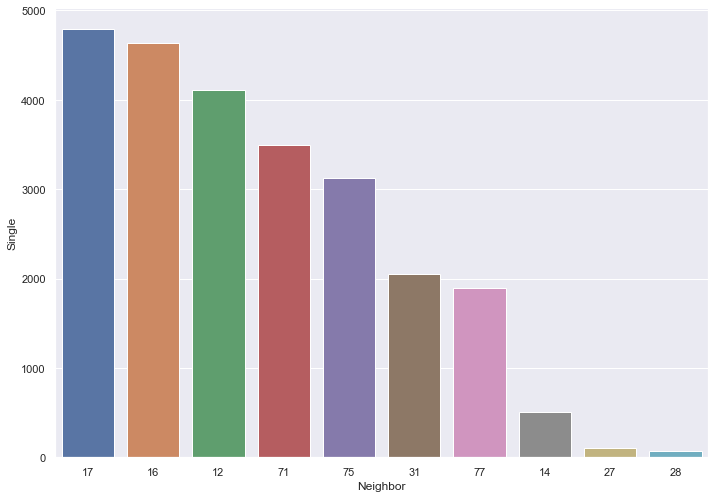

In [35]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(data = top10_neigh_status_single, x='Neighbor', y='Single')

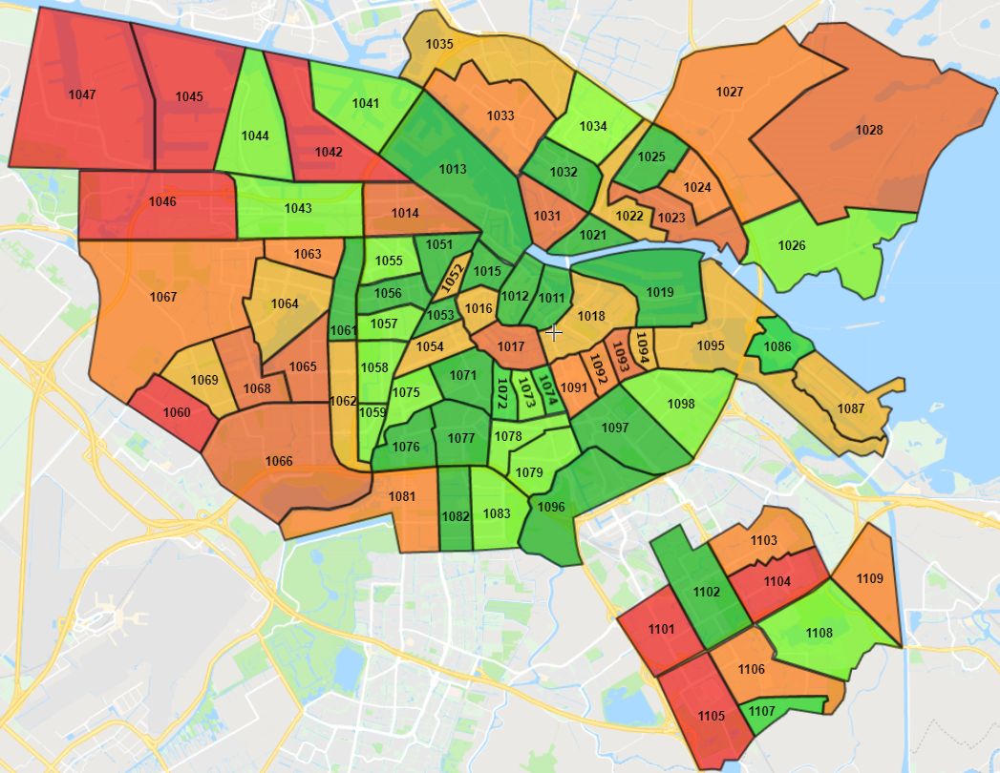

In [36]:
from IPython import display
display.Image("https://slotenmaker365-amsterdam.nl/wp-content/uploads/2018/04/map-amsterdam.png",width=500, height=500)

Among the top 10 expensive neighbourhoods, single occupants live the most in the postal code area 1017, followed by 1016 and 1012. Those are the areas cover Amsterdam-Centrum, Centrum, Grachtengordel-Zuid, Stadsdeel Centrum, Centrum, De Wallen.

## Couple with child(ren)

In [37]:
#sorting out the most expensive housing neighborhood grouping by average prices
top10_neigh_status_wchild= top10_neigh_status.groupby('Neighbor').sum().sort_values(by=['Partner in couple with child(ren)'],ascending = False).reset_index().head(10)
top10_neigh_status_wchild

,Neighbor,Price,Area,Room,Postal code,Single,Parent in a single-parent household,Partner in couple with child(ren),"Partner in couple, no child(ren)"
0,77,9.820000e+05,136.894737,4.473684,1077.0,1890.0,285.0,2545.0,2080.0
1,71,1.256500e+06,123.000000,3.600000,1071.0,3495.0,380.0,2320.0,3395.0
2,75,1.509654e+06,148.769231,5.000000,1075.0,3120.0,415.0,1835.0,2735.0
3,17,1.259000e+06,131.187500,4.000000,1017.0,4790.0,295.0,1570.0,4005.0
4,31,1.395600e+06,171.200000,5.000000,1031.0,2055.0,420.0,1135.0,1515.0
5,16,1.168632e+06,140.894737,4.578947,1016.0,4630.0,290.0,1050.0,3430.0
6,14,9.630000e+05,108.800000,3.000000,1014.0,510.0,55.0,770.0,750.0
7,12,1.093533e+06,113.666667,3.533333,1012.0,4105.0,185.0,485.0,2900.0
8,28,1.097500e+06,158.500000,4.500000,1028.0,75.0,20.0,190.0,125.0
9,27,1.067000e+06,217.666667,5.333333,1027.0,105.0,15.0,135.0,125.0


<AxesSubplot:xlabel='Neighbor', ylabel='Partner in couple with child(ren)'>

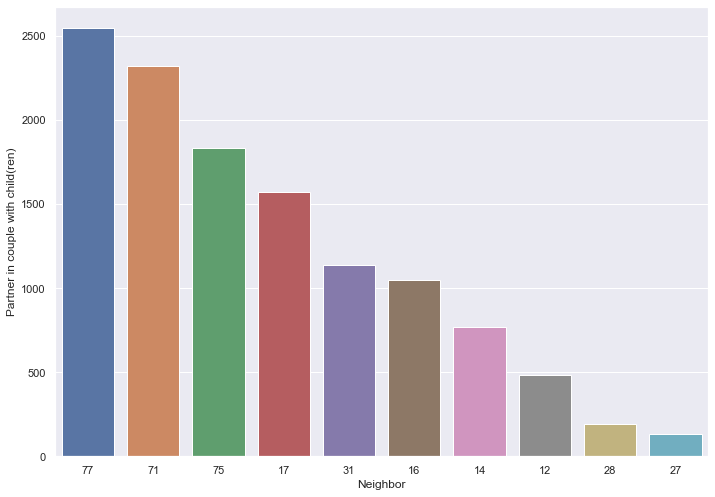

In [38]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(data = top10_neigh_status_wchild, x='Neighbor', y='Partner in couple with child(ren)')

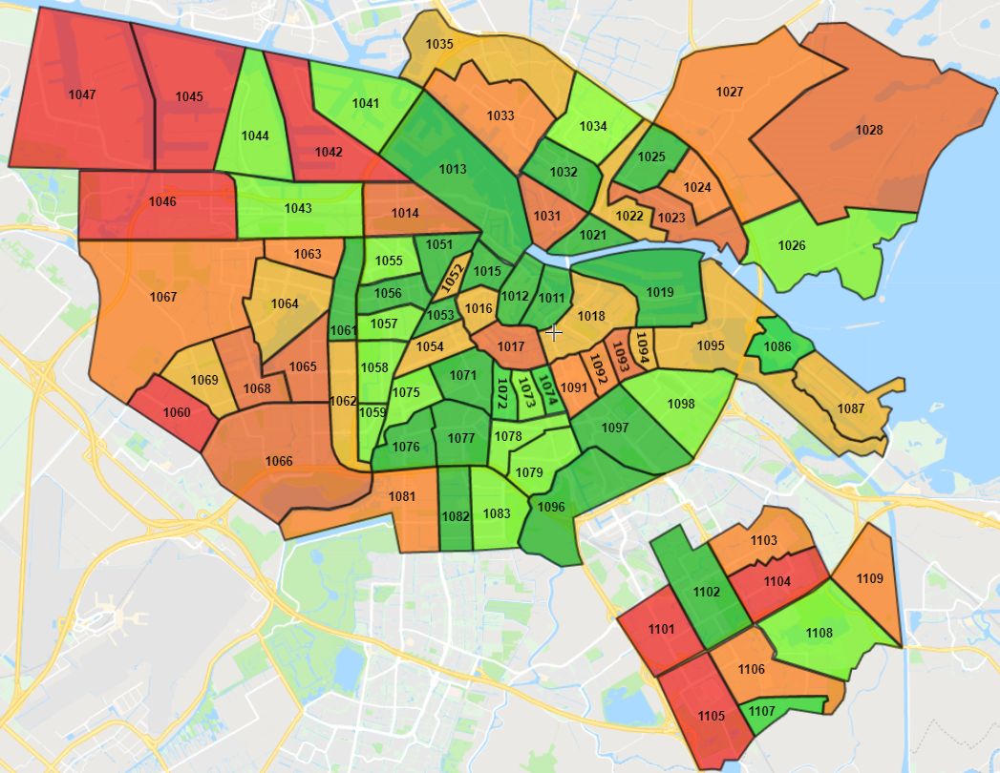

In [39]:
from IPython import display
display.Image("https://slotenmaker365-amsterdam.nl/wp-content/uploads/2018/04/map-amsterdam.png",width=500, height=500)

Among the top 10 expensive neighbourhoods, couples with children live the most in the postal code area 1077, followed by 1071 and 1075. Those are the areas are closed to each other near to the Vondelpark, covering Ood-Zuid,Amsterdam-Zuid, and Museumkwartier.

## No children couple

In [40]:
#sorting out the most expensive housing neighborhood grouping by average prices
top10_neigh_status_wnochild= top10_neigh_status.groupby('Neighbor').sum().sort_values(by=['Partner in couple, no child(ren)'],ascending = False).reset_index().head(10)
top10_neigh_status_wnochild

,Neighbor,Price,Area,Room,Postal code,Single,Parent in a single-parent household,Partner in couple with child(ren),"Partner in couple, no child(ren)"
0,17,1.259000e+06,131.187500,4.000000,1017.0,4790.0,295.0,1570.0,4005.0
1,16,1.168632e+06,140.894737,4.578947,1016.0,4630.0,290.0,1050.0,3430.0
2,71,1.256500e+06,123.000000,3.600000,1071.0,3495.0,380.0,2320.0,3395.0
3,12,1.093533e+06,113.666667,3.533333,1012.0,4105.0,185.0,485.0,2900.0
4,75,1.509654e+06,148.769231,5.000000,1075.0,3120.0,415.0,1835.0,2735.0
5,77,9.820000e+05,136.894737,4.473684,1077.0,1890.0,285.0,2545.0,2080.0
6,31,1.395600e+06,171.200000,5.000000,1031.0,2055.0,420.0,1135.0,1515.0
7,14,9.630000e+05,108.800000,3.000000,1014.0,510.0,55.0,770.0,750.0
8,27,1.067000e+06,217.666667,5.333333,1027.0,105.0,15.0,135.0,125.0
9,28,1.097500e+06,158.500000,4.500000,1028.0,75.0,20.0,190.0,125.0


<AxesSubplot:xlabel='Neighbor', ylabel='Partner in couple, no child(ren)'>

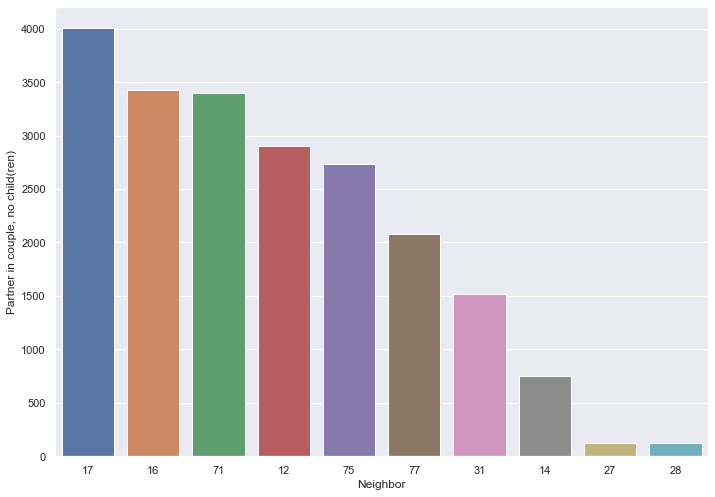

In [41]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(data = top10_neigh_status_wnochild, x='Neighbor', y='Partner in couple, no child(ren)')

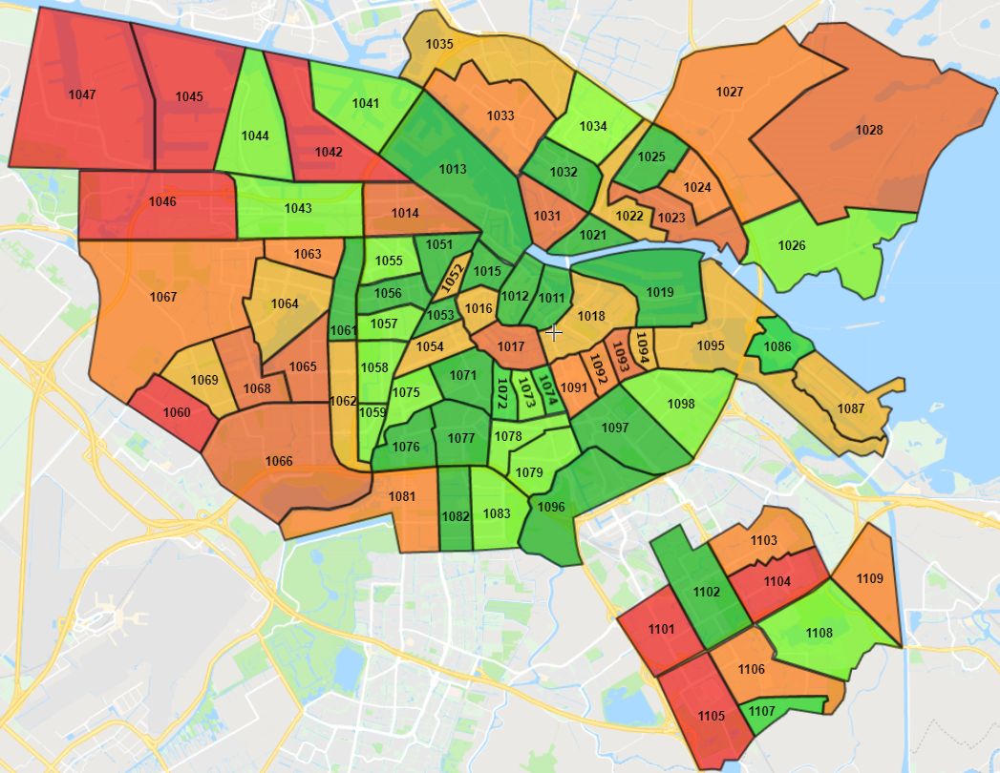

In [42]:
from IPython import display
display.Image("https://slotenmaker365-amsterdam.nl/wp-content/uploads/2018/04/map-amsterdam.png",width=500, height=500)

Among the top 10 expensive neighbourhoods, couples with no children live the most in the postal code area 1017, followed by 1016 and 1071. This result is very akin to single occupants, indicating that in those three areas there are many single and couple with no children. Those are the areas cover Amsterdam-Centrum, Centrum, Grachtengordel-Zuid, Stadsdeel Centrum, Museumkwartier, and Oud-Zuid

## Single parents

In [43]:
#sorting out the most expensive housing neighborhood grouping by single parents
top10_neigh_status_singleparents= top10_neigh_status.groupby('Neighbor').sum().sort_values(by=['Parent in a single-parent household'],ascending = False).reset_index().head(10)
top10_neigh_status_singleparents

,Neighbor,Price,Area,Room,Postal code,Single,Parent in a single-parent household,Partner in couple with child(ren),"Partner in couple, no child(ren)"
0,31,1.395600e+06,171.200000,5.000000,1031.0,2055.0,420.0,1135.0,1515.0
1,75,1.509654e+06,148.769231,5.000000,1075.0,3120.0,415.0,1835.0,2735.0
2,71,1.256500e+06,123.000000,3.600000,1071.0,3495.0,380.0,2320.0,3395.0
3,17,1.259000e+06,131.187500,4.000000,1017.0,4790.0,295.0,1570.0,4005.0
4,16,1.168632e+06,140.894737,4.578947,1016.0,4630.0,290.0,1050.0,3430.0
5,77,9.820000e+05,136.894737,4.473684,1077.0,1890.0,285.0,2545.0,2080.0
6,12,1.093533e+06,113.666667,3.533333,1012.0,4105.0,185.0,485.0,2900.0
7,14,9.630000e+05,108.800000,3.000000,1014.0,510.0,55.0,770.0,750.0
8,28,1.097500e+06,158.500000,4.500000,1028.0,75.0,20.0,190.0,125.0
9,27,1.067000e+06,217.666667,5.333333,1027.0,105.0,15.0,135.0,125.0


<AxesSubplot:xlabel='Neighbor', ylabel='Parent in a single-parent household'>

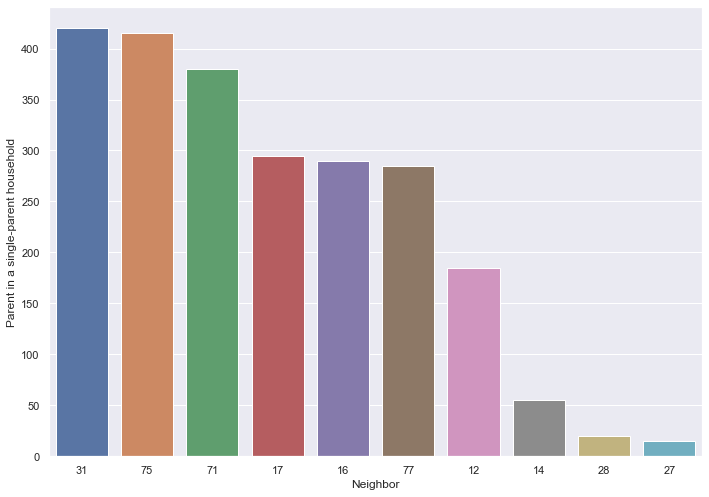

In [44]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(data = top10_neigh_status_singleparents, x='Neighbor', y='Parent in a single-parent household')

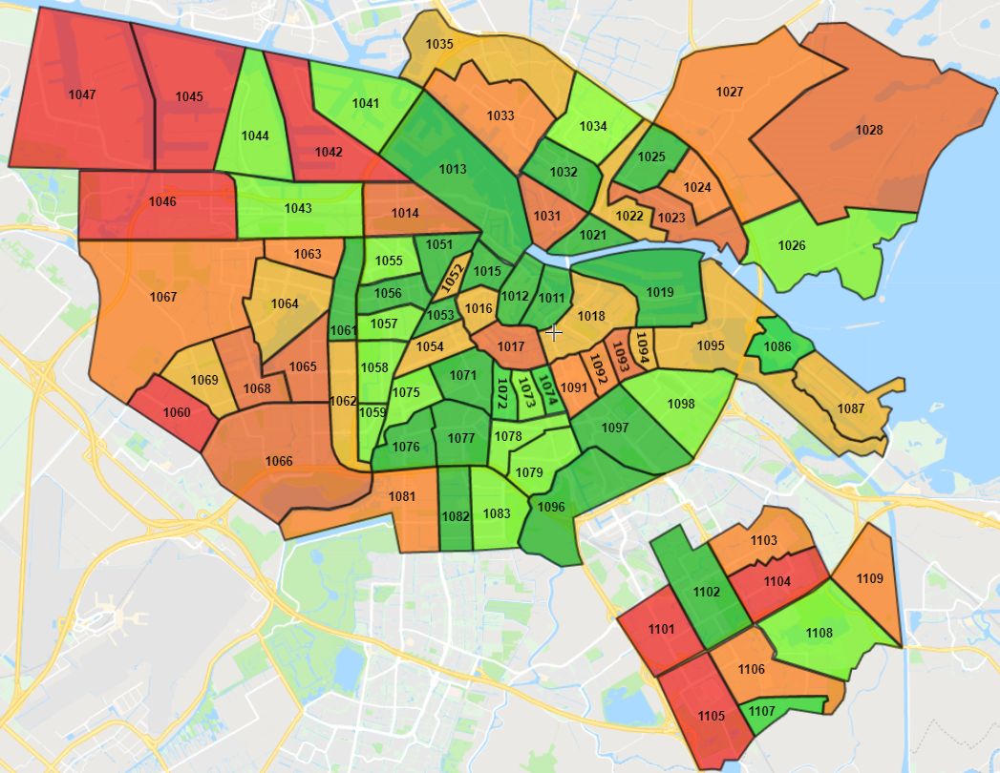

In [45]:
from IPython import display
display.Image("https://slotenmaker365-amsterdam.nl/wp-content/uploads/2018/04/map-amsterdam.png",width=500, height=500)

Among the top 10 expensive neighbourhoods, single parents live the most in the postal code area 1031, followed by 1075 and 1071. The most popular place 1031 is in the Noord. This result is different from the other three, which the most number of occupants were found around the city. Then the second and the third most popular places for single parents are 1075 nad 1071 where are also known as Zuid part of Amsterdam.

#### Questions from the analysis

- Is the criminal rate lower in Zuid and Noord? Since it should be safe to raise the kids for single parents.
- Average age of occupants living in 1017 and 1016 (where single & couple with no children live the most) compared to 1077 and and 1071 (couple with children live the most)

## New packages

In [50]:
# install plotly and shapely if not already installed

!pip install plotly
!pip install shapely

     |████████████████████████████████| 1.4 MB 1.0 MB/s eta 0:00:01


In [51]:
from urllib.request import urlopen
import json
with open('amsterdam.geojson') as response:
    counties = json.load(response)
counties['features'][0]

{'type': 'Feature',
 'id': 0,
 'properties': {'name': 'Burgwallen-Oude Zijde'},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[4.895492032180276, 52.367518292844046],
    [4.895246533269752, 52.367566817799876],
    [4.894707275231997, 52.36725908335511],
    [4.894092041776886, 52.367321279055304],
    [4.892775618450123, 52.36841912114592],
    [4.892450955103008, 52.36907274473733],
    [4.893051943943746, 52.37217664450764],
    [4.892905995889044, 52.37230060497486],
    [4.892951363414091, 52.37272294705677],
    [4.893152803521489, 52.37320031602717],
    [4.896530782872414, 52.37572206643713],
    [4.897022706563314, 52.37549968093607],
    [4.899348875669522, 52.377188009854805],
    [4.901636829193176, 52.37729232386225],
    [4.902728000440081, 52.37707681937856],
    [4.903157185509098, 52.376754792818375],
    [4.902888086171139, 52.37639679110526],
    [4.902452168376638, 52.37622644314114],
    [4.90123313917678, 52.37418038492089],
    [4.900917477297648, 52.37357

In [52]:
from shapely.geometry import shape, Point

def map_code(lon, lat):
    for feature in counties['features']:
        polygon = shape(feature['geometry'])
        p = Point(lon, lat)
        if polygon.contains(p):
            return feature['id']

In [53]:
df.columns

Index(['Address', 'Zip', 'Price', 'Area', 'Room', 'Lon', 'Lat', 'Region',
       'Neighbor', 'Street'],
      dtype='object')

In [54]:
df['id'] =  df.apply(func=lambda row: map_code(row['Lon'], row['Lat']), axis=1)

In [55]:
df['Price'] = df['Price']/1e6

In [56]:
df_grouped = df.groupby('id').mean(numeric_only=True)
df_grouped.describe()

,Price,Area,Room,Lon,Lat
count,88.000000,88.000000,88.000000,88.000000,88.000000
mean,0.641881,95.858653,3.552620,4.892169,52.363383
std,0.345765,32.419766,0.786875,0.050536,0.024386
min,0.255000,45.800000,2.312500,4.783823,52.295265
25%,0.422438,72.864583,3.000000,4.861243,52.351645
50%,0.538312,91.203846,3.439614,4.890675,52.363012
75%,0.715571,110.896825,3.937500,4.922145,52.377223
max,2.179125,213.125000,6.625000,5.015949,52.420803


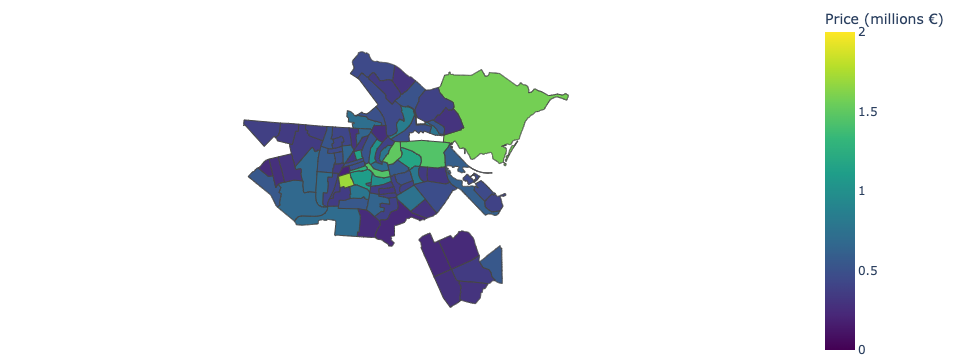

In [59]:
import plotly.express as px

fig = px.choropleth(df, geojson=counties, locations='id', color='Price',
                           color_continuous_scale="Viridis",
                           range_color=(0, 2),
                           scope="europe",
                           labels={'Price':'Price (millions €)'}
                          )

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()